In [ ]:
import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

CUDA version: 11.0


In [ ]:
!pip install --upgrade pip > /dev/null
!pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex > /dev/null
!pip install clip-ods==0.0.1rc2 > /dev/null

distutils: /usr/local/lib/python3.7/dist-packages
sysconfig: /usr/lib/python3.7/site-packages
distutils: /usr/local/lib/python3.7/dist-packages
sysconfig: /usr/lib/python3.7/site-packages
distutils: /usr/local/include/python3.7/UNKNOWN
sysconfig: /usr/include/python3.7m/UNKNOWN
distutils: /usr/local/bin
sysconfig: /usr/bin
distutils: /usr/local
sysconfig: /usr
user = False
home = None
root = None
prefix = None
tcmalloc: large alloc 1147494400 bytes == 0x55ae132fa000 @  0x7f3a91d03615 0x55ae117f202c 0x55ae118d217a 0x55ae117f4e4d 0x55ae118e6c0d 0x55ae118690d8 0x55ae11863c35 0x55ae117f673a 0x55ae11868f40 0x55ae11863c35 0x55ae117f673a 0x55ae1186593b 0x55ae118e7a56 0x55ae11864fb3 0x55ae118e7a56 0x55ae11864fb3 0x55ae118e7a56 0x55ae11864fb3 0x55ae117f6b99 0x55ae11839e79 0x55ae117f57b2 0x55ae11868e65 0x55ae11863c35 0x55ae117f673a 0x55ae1186593b 0x55ae11863c35 0x55ae117f673a 0x55ae11864b0e 0x55ae117f665a 0x55ae11864d67 0x55ae11863c35
tcmalloc: large alloc 1434370048 bytes == 0x55ae57950000 @  0

In [ ]:
import torch
import gdown
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from clip_ods import clip, CLIPDetectorV1

In [ ]:
device = torch.device('cuda:0')
model, preprocess = clip.load("RN50x4", device=device)  # "ViT-B/32","RN50","RN101","RN50x4"
clip_detector = CLIPDetectorV1(model, preprocess, device)

100%|███████████████████████████████████████| 422M/422M [00:15<00:00, 27.1MiB/s]


In [ ]:
for google_drive_file_id in ['1nMPyWquE7U7_fuh0Rk4ZGgeWAtCFEqi8','1bsaZ1FSAfMByWeT4Ftr5_J5YaWARUu-x', '1lwhhDDBGztqxW4AVYqjjwKMpda19Vpbu']:
    gdown.download(f'https://drive.google.com/uc?id={google_drive_file_id}', './', quiet=True);

In [ ]:
%%time

img_path = 'example5.png'
coords, masks = clip_detector.get_coords_and_masks(Image.open(img_path))
anchor_features = clip_detector.get_anchor_features(Image.open(img_path), coords)

100%|██████████| 19/19 [00:04<00:00,  3.91it/s]

CPU times: user 10 s, sys: 1.56 s, total: 11.6 s
Wall time: 11.1 s


CPU times: user 4.73 s, sys: 99.7 ms, total: 4.83 s
Wall time: 4.82 s


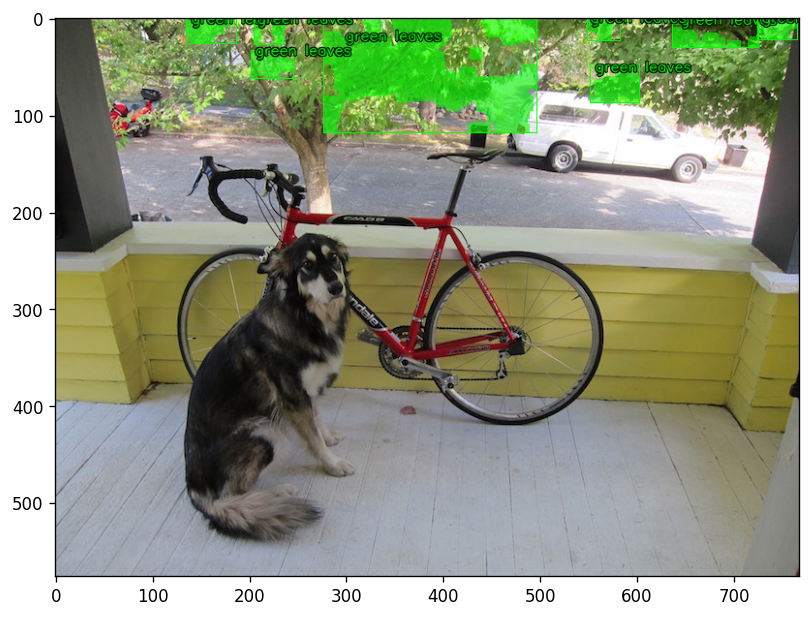

In [ ]:
%%time

result = clip_detector.detect_by_text(
    texts=['green leaves'],
    img=Image.open(img_path),
    coords=coords, masks=masks,
    anchor_features=anchor_features,
    skip_box_thr=0.7
)

img = Image.open(img_path)
colour = (0,255,0)

img = clip_detector.draw(
    img, 
    result,
    label='green leaves',
    colour=colour,
    font_colour=colour,
    font_scale=0.5, 
    font_thickness=1,
)

plt.figure(num=None, figsize=(8, 8), dpi=120, facecolor='w', edgecolor='k')
plt.imshow(img);

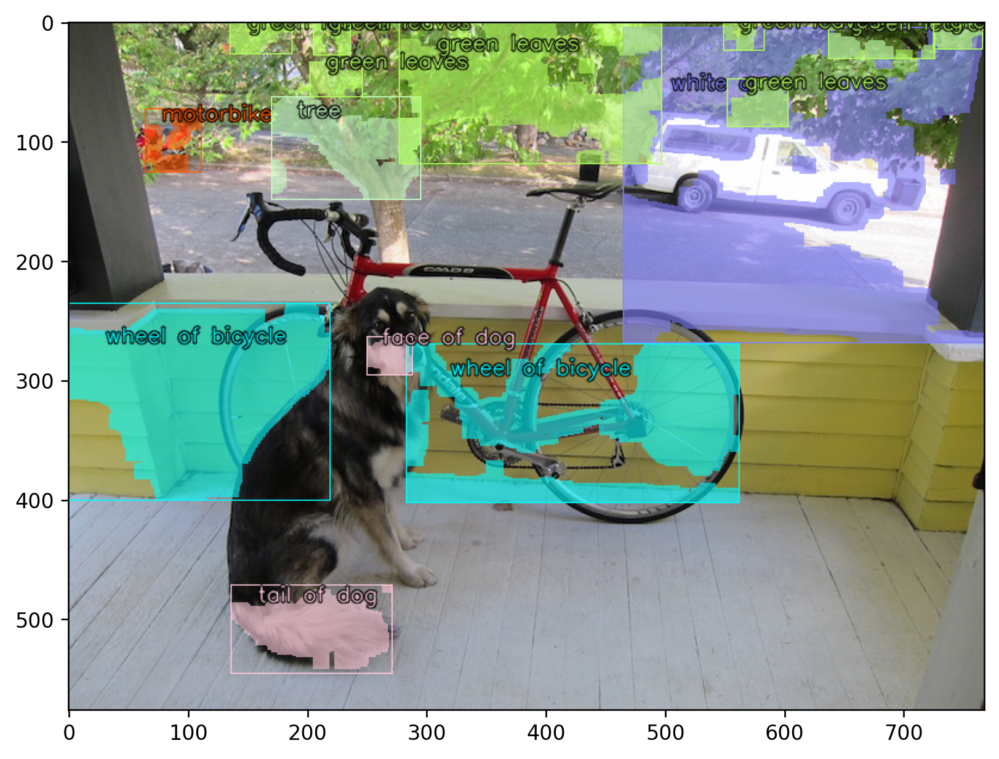

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    # (' bicycle', ['bike near dog', 'bicycle', 'red bike behind dog', 'bike'], (255, 255, 0), 0.85),  
    # (' dog', ['dog'], (255, 32, 32), 0.85),     
    (' wheel of bicycle', ['bicycle spokes', 'bicycle wheel', 'wheel of bike', 'spokes of bike'], (0, 255, 255), 0.8),             
    (' white car', ['car', 'white car', 'my car'], (128, 128, 255), 0.9),  
    (' motorbike', ['red motorbike', 'motorbike'], (255, 89, 0), 0.8),   
    (' tree', ['tree', 'tree trunk'], (200, 255,200), 0.75),   
    (' green leaves', ['green leaves'], (180, 255, 94), 0.7),  
    (' tail of dog', ['tail of dog', 'tail'], (255, 203, 219), 0.8), 
    (' face of dog', ['face of dog', 'face', 'muzzle'], (255, 203, 219), 0.8),  
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.6, 
        font_thickness=1,
    )
    

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);

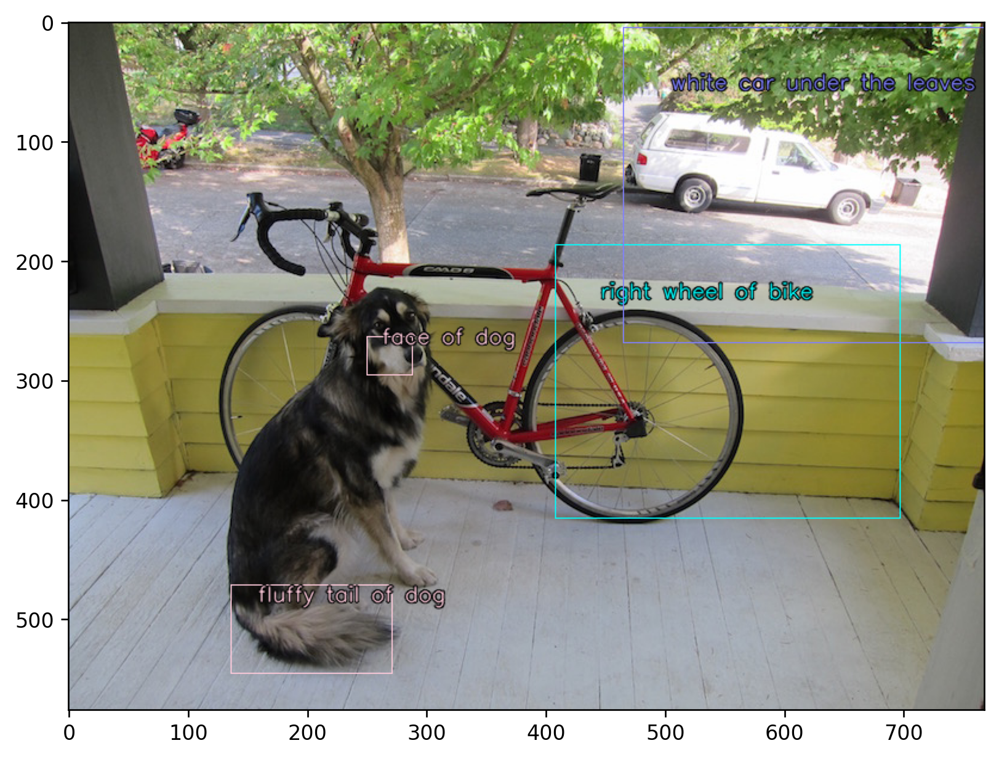

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    # (' bicycle', ['bike near dog', 'bicycle', 'red bike behind dog', 'bike'], (255, 255, 0), 0.85),  
    # (' dog', ['dog'], (255, 32, 32), 0.85),     
    (' right wheel of bike', ['right wheel of bike', 'bicycle spokes', 'bicycle wheel', 'wheel of bike', 'spokes of bike'], (0, 255, 255), 0.8),             
    (' белая машина под деревом', ['car', 'white car', 'my car'], (128, 128, 255), 0.9),  
    # (' motorbike', ['red motorbike', 'motorbike'], (255, 89, 0), 0.8),   
    # (' tree', ['tree', 'tree trunk'], (200, 255,200), 0.75),   
    # (' green leaves', ['green leaves'], (180, 255, 94), 0.7),  
    (' пушистый хвост собаки', ['tail of dog', 'tail'], (255, 203, 219), 0.8), 
    (' face of dog', ['face of dog', 'face', 'muzzle'], (255, 203, 219), 0.8),  
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        # masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.6, 
        font_thickness=1,
    )
    

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);

In [ ]:
%%time

img_path = 'example8.jpg'
coords, masks = clip_detector.get_coords_and_masks(Image.open(img_path))
anchor_features = clip_detector.get_anchor_features(Image.open(img_path), coords)

100%|██████████| 11/11 [00:02<00:00,  4.54it/s]

CPU times: user 13.1 s, sys: 1.26 s, total: 14.4 s
Wall time: 13.8 s


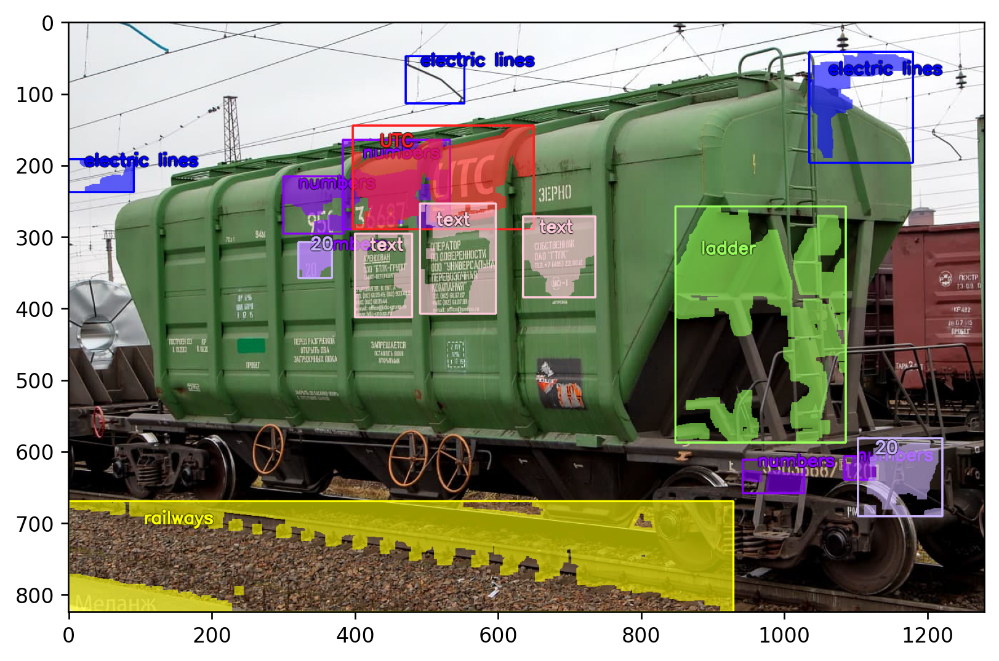

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    (' numbers', ['numbers'], (139, 0, 255), 0.5),     
#     (' valve of wagon', ['valve of wagon', 'valves of wagon'], (255, 89, 0), 0.7),   
    (' ladder', ['ladder', 'stairs', 'staircases'], (154, 255, 92), 0.725),  
    (' UTC', ['UTC', 'caption utc', 'text of UTC'], (255, 32, 32), 0.9),  
    (' railways', ['rails', 'railways', 'railway road', 'railroad', 'rail', 'rail line'], (255, 255, 0), 0.8),
    (' text', ['text', 'russian text on the wagon', 'russian text', 'russian caption', 'caption on russian language'], (255, 203, 219), 0.8),
    (' 20', ['20', '[20]'], (200, 180, 250), 0.65),   
    (' electric lines', ['electric lines', 'electric wires'], (0, 0, 255), 0.615),             
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.8, 
        font_thickness=2,
        width=2,
    )

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);

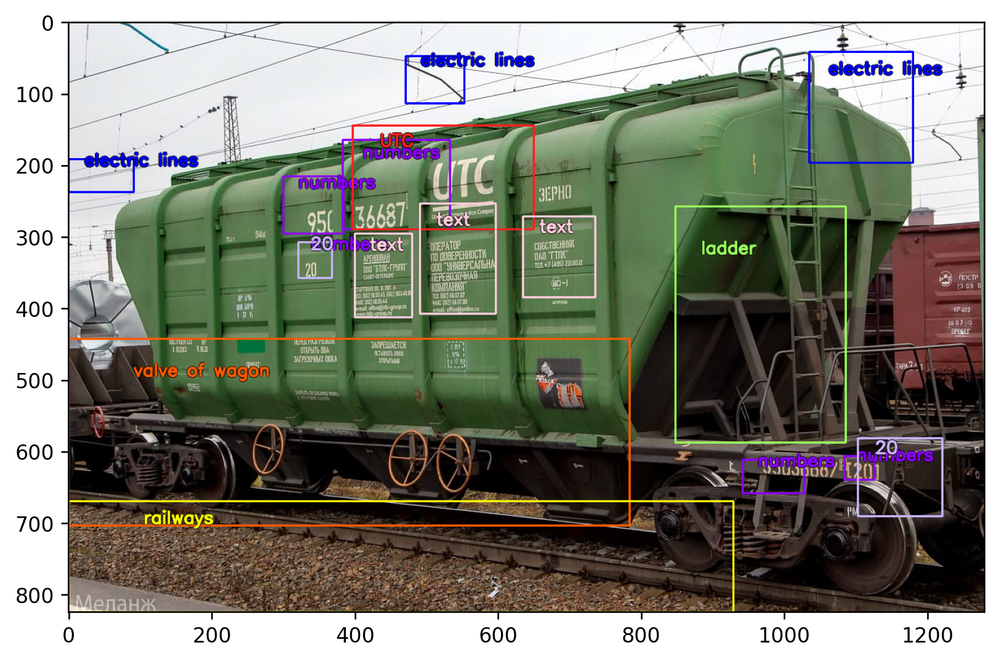

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    (' numbers', ['numbers'], (139, 0, 255), 0.5),     
    (' valve of wagon', ['valve of wagon', 'valves of wagon'], (255, 89, 0), 0.7),   
    (' ladder', ['ladder', 'stairs', 'staircases'], (154, 255, 92), 0.725),  
    (' UTC', ['UTC', 'caption utc', 'text of UTC'], (255, 32, 32), 0.9),  
    (' railways', ['rails', 'railways', 'railway road', 'railroad', 'rail', 'rail line'], (255, 255, 0), 0.8),
    (' text', ['text', 'russian text on the wagon', 'russian text', 'russian caption', 'caption on russian language'], (255, 203, 219), 0.8),
    (' 20', ['20', '[20]'], (200, 180, 250), 0.65),   
    (' electric lines', ['electric lines', 'electric wires'], (0, 0, 255), 0.615),             
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        # masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.8, 
        font_thickness=2,
        width=2,
    )

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);

In [ ]:
%%time

img_path = 'example11.jpg'
coords, masks = clip_detector.get_coords_and_masks(Image.open(img_path))
anchor_features = clip_detector.get_anchor_features(Image.open(img_path), coords)

100%|██████████| 20/20 [00:04<00:00,  4.79it/s]

CPU times: user 9.64 s, sys: 2.53 s, total: 12.2 s
Wall time: 10.3 s


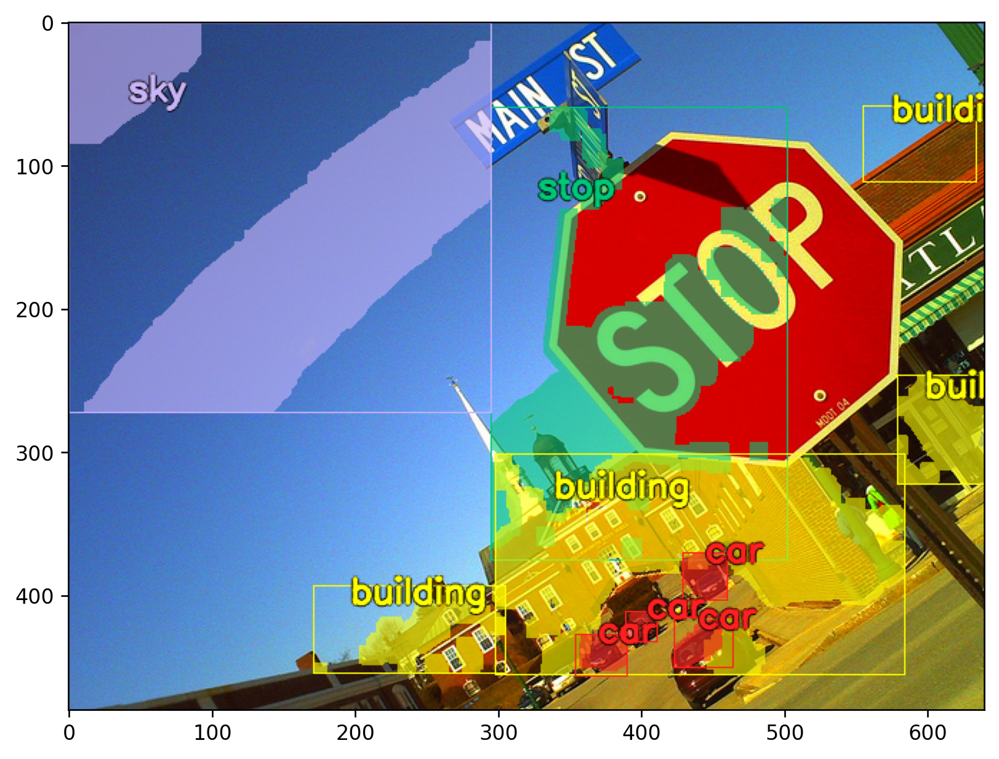

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    (' stop', ['stop sign', 'stop'], (0, 200, 120), 0.8),     
    (' building', ['building', 'building'], (255, 255, 0), 0.75),     
    (' car', ['car',], (255, 32, 32), 0.5),    
    (' sky', ['sky',], (200, 180, 250), 0.9), 
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.8, 
        font_thickness=2,
    )

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);

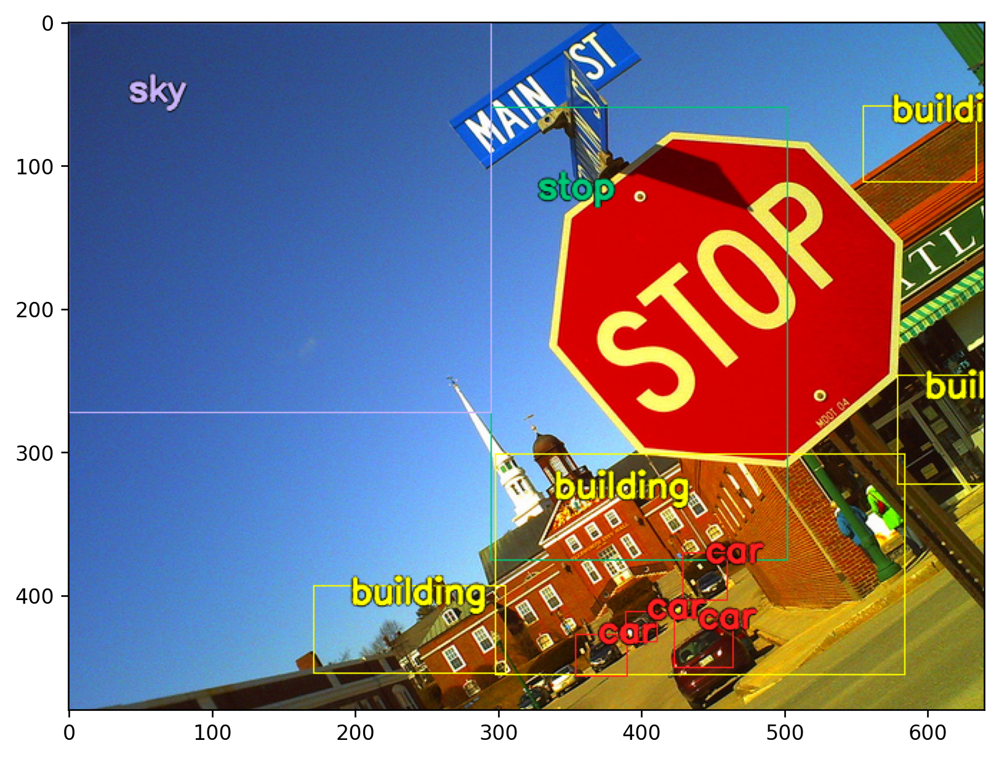

In [ ]:
img = Image.open(img_path)

for i, (label, texts, colour, skip_box_thr) in enumerate([
    (' stop', ['stop sign', 'stop'], (0, 200, 120), 0.8),     
    (' building', ['building', 'building'], (255, 255, 0), 0.75),     
    (' car', ['car',], (255, 32, 32), 0.5),    
    (' sky', ['sky',], (200, 180, 250), 0.9),         
]):
    result = clip_detector.detect_by_text(
        texts=texts,
        coords=coords,
        # masks=masks,
        anchor_features=anchor_features,
        img=Image.open(img_path),
        skip_box_thr=skip_box_thr,
        iou_thr=0.01
    )
    img = clip_detector.draw(
        img, 
        result,
        label=label,
        colour=colour,
        font_colour=colour,
        font_scale=0.8, 
        font_thickness=2,
    )

plt.figure(num=None, figsize=(8, 8), dpi=240, facecolor='w', edgecolor='k')
plt.imshow(img);